#**Situação acadêmica dos discentes da Universidade Federal de Pernambuco em 2023 - Apresentação dos Dados**

**Data Dictionary**

| Variável | Definição                                 | Chave                                            | Notas                                                                                                                                       |
|----------|--------------------------------------------|------------------------------------------------|---------------------------------------------------------------------------------------------------------------------------------------------|
| ID_DISCENTE | Identificador do estudante| Numérica| - |
|ANO_NASCIMENTO |Ano de nascimento do discente|Numérica|Existe no dataset duas ocorrências do valor 2023, acredito que a intenção era preencher com 2003|
|PERIODO_INGRESSO |Período de ingresso do discente|Numérica|-|
|TIPO_INGRESSO| Meio de ingresso |Texto| Refere-se à forma que o discente ingressou, seja SISU, transferência, etc |
|PERIODO_LETIVO | Semestre onde o dataset se situa|Numérica| Ano de 2023 |
|CAMPUS|Campus onde o discente está alocado|Texto|A UFPE proporciona 3 opções: Reitor Joaquim Amazonas (campus Recife), Agreste, e Vitória
|CD_INEP |Identificador do aluno pelo INEP |Numérica| - |
|CURSO |Nome do curso|Texto |Cursos do Agreste e de Vitória recebem as siglas CAA e CAV respectivamente|
|CARGA_HORARIA_CURSO |Refere-se à carga horária do curso |Numérica| - |
|AREA_CURSO |Área do curso de acordo com as areas de conhecimento|Texto |-|
|TURNO |Turno das aulas |Texto |-|
|MODALIDADE |Modalidade das aulas |Texto |Presencial, híbrido, etc|
|COTAS| Tipo da cota usada |Texto| Discentes que não usaram cotas constam com o valor A0, que indica Ampla Concorrência |
|NATURALIDADE|Cidade onde o estudante nasceu|Texto| - |
|ESCOLA_PUBLICA| Se o estudante vem de escola pública |Texto| - |
|BLS_ASSIST| Se o aluno recebe bolsa de assistência |Texto| - |
|DS_TP_SIT_ACAD| Situação acadêmica |Texto| - |
|MONITOR_PROGRAD| Se o aluno é monitor |Texto| - |
|SEXO |Sexo do discente|Caractere|-|
|COR| Etnia do estudante |Texto| - |
|NACIONALIDADE|País onde o estudante nasceu|Texto|-|
|CIDADE_NATAL|Cidade onde o estudante nasceu|Texto|-|
|UF_NAT|Unidade federativa onde o estudante nasceu|Texto|-|
|DEFIC |Se o discente é PCD ou não|Caractere|-|
|MOB_ACAD|Se o estudante está fazendo intercâmbio|Texto|-|
|TIPO_MOB_ACAD|Tipo de intercâmbio|Texto|-|
|IES_DEST|Instituição de destino|Texto|-|
|PAIS_DEST|País de destino|Texto|-|

---


## **Configurações, imports e testes**

In [72]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import geopandas as gpd
import json
import folium
import scipy
import scipy.stats

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from numpy.random import seed
from numpy.random import randint
from numpy import mean

In [73]:
from google.colab import drive #comando de importação do drive
drive.mount('/content/gdrive', force_remount=True) #serve para acessar os arquivos do drive

Mounted at /content/gdrive


In [74]:
discentes = pd.read_csv('/content/gdrive/My Drive/estatistica/situacao-academica-2023-ufpe.csv')

<ipython-input-74-16602579872a>:1: DtypeWarning:

Columns (24,25,27) have mixed types. Specify dtype option on import or set low_memory=False.



In [75]:
discentes.head(5)

,ID_DISCENTE,ANO_NASCIMENTO,PERIODO_INGRESSO,TIPO_INGRESSO,PERIODO_LETIVO,CAMPUS,CD_INEP,CURSO,CARGA_HORARIA_CURSO,AREA_CURSO,...,COR,NACIONALIDADE,CIDADE_NAT,UF_NAT,DEFIC,MOB_ACAD,TIPO_MOB_ACAD,IES_DEST,TIPO_MOB_ACAD_INTERNAC,PAIS_DEST
0,43,1979,2022.2,SISU,2023.1,REITOR JOAQUIM AMAZONAS,21847,CIÊNCIAS SOCIAIS - LICENCIATURA,2310,CIENCIAS SOCIALMENTE APLICAVEIS,...,NÃO DECLARADO,BRA,RECIFE,PE,NÃO,NÃO,NaN,NaN,NaN,NaN
1,43,1979,2022.2,SISU,2023.2,REITOR JOAQUIM AMAZONAS,21847,CIÊNCIAS SOCIAIS - LICENCIATURA,2310,CIENCIAS SOCIALMENTE APLICAVEIS,...,NÃO DECLARADO,BRA,RECIFE,PE,NÃO,NÃO,NaN,NaN,NaN,NaN
2,741,1975,2019.2,SISU,2023.1,REITOR JOAQUIM AMAZONAS,13580,PEDAGOGIA,3210,HUMANAS,...,BRANCA,BRA,BELO JARDIM,PE,NÃO,NÃO,NaN,NaN,NaN,NaN
3,741,1975,2019.2,SISU,2023.2,REITOR JOAQUIM AMAZONAS,13580,PEDAGOGIA,3210,HUMANAS,...,BRANCA,BRA,BELO JARDIM,PE,NÃO,NÃO,NaN,NaN,NaN,NaN
4,809,1978,2023.1,SISU,2023.1,REITOR JOAQUIM AMAZONAS,13574,CIÊNCIAS ECONÔMICAS,3000,CIENCIAS EXATAS E DA TERRA,...,NaN,BRA,RECIFE,PE,NÃO,NÃO,NaN,NaN,NaN,NaN


---


## **Estatística descritiva**

### **Box plot**

In [76]:
box_area = px.box(discentes, x="AREA_CURSO", y= "ANO_NASCIMENTO")
box_area.show()

In [77]:
box_situ = px.box(discentes, x="DS_TP_SIT_ACAD", y= "ANO_NASCIMENTO")
box_situ.show()

In [78]:
box_nac = px.box(discentes, x='NACIONALIDADE', y= "ANO_NASCIMENTO")
box_nac.show()

In [79]:
box_sexo = px.box(discentes, x='SEXO', y= "ANO_NASCIMENTO")
box_sexo.show()

In [80]:
box_monitor = px.box(discentes, x='MONITOR_PROGRAD', y= "ANO_NASCIMENTO")
box_monitor.show()

### **Histogramas**

In [81]:
fig = px.histogram(discentes, x='SEXO') #função histograma e o comando marginal cria histogramas marginais e ocomando rug cria "marcas"
fig.show()

In [82]:
fig = px.histogram(discentes, x='COTAS')
fig.show()

In [83]:
fig = px.histogram(discentes, x='AREA_CURSO')
fig.show()

In [84]:
fig = px.histogram(discentes, x='DS_TP_SIT_ACAD')
fig.show()

In [85]:
fig = px.histogram(discentes, x='ANO_NASCIMENTO')
fig.show()

In [86]:
fig = px.histogram(discentes, x='COR')
fig.show()

In [87]:
fig = px.histogram(discentes, x='TIPO_INGRESSO')
fig.show()

In [88]:
fig = px.histogram(discentes, x='CAMPUS')
fig.show()

In [89]:
fig = px.histogram(discentes, x='PERIODO_INGRESSO')
fig.show()

In [90]:
fig = px.histogram(discentes, x='TURNO')
fig.show()

In [91]:
fig = px.histogram(discentes, x='ESCOLA_PUBLICA')
fig.show()

In [92]:
fig = px.histogram(discentes, x='BLS_ASSIST')
fig.show()

In [93]:
fig = px.histogram(discentes, x='MONITOR_PROGRAD')
fig.show()

In [94]:
fig = px.histogram(discentes, x='NACIONALIDADE')
fig.show()

In [95]:
fig = px.histogram(discentes, x='DEFIC')
fig.show()

### **Scatter plot**

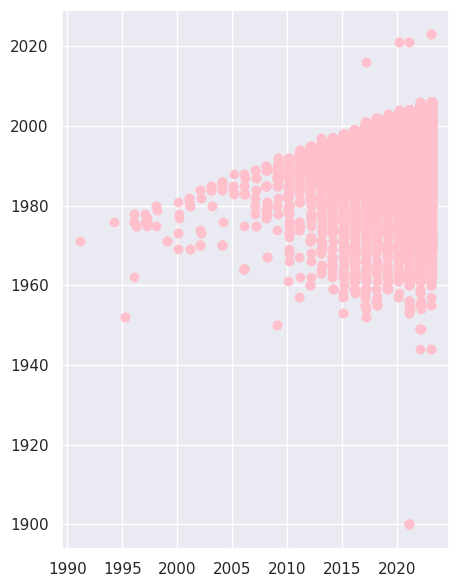

In [96]:
x = discentes['PERIODO_INGRESSO']
y =  discentes['ANO_NASCIMENTO']

plt.plot(x, y, 'o', color='pink')

<Axes: xlabel='PERIODO_INGRESSO', ylabel='ANO_NASCIMENTO'>

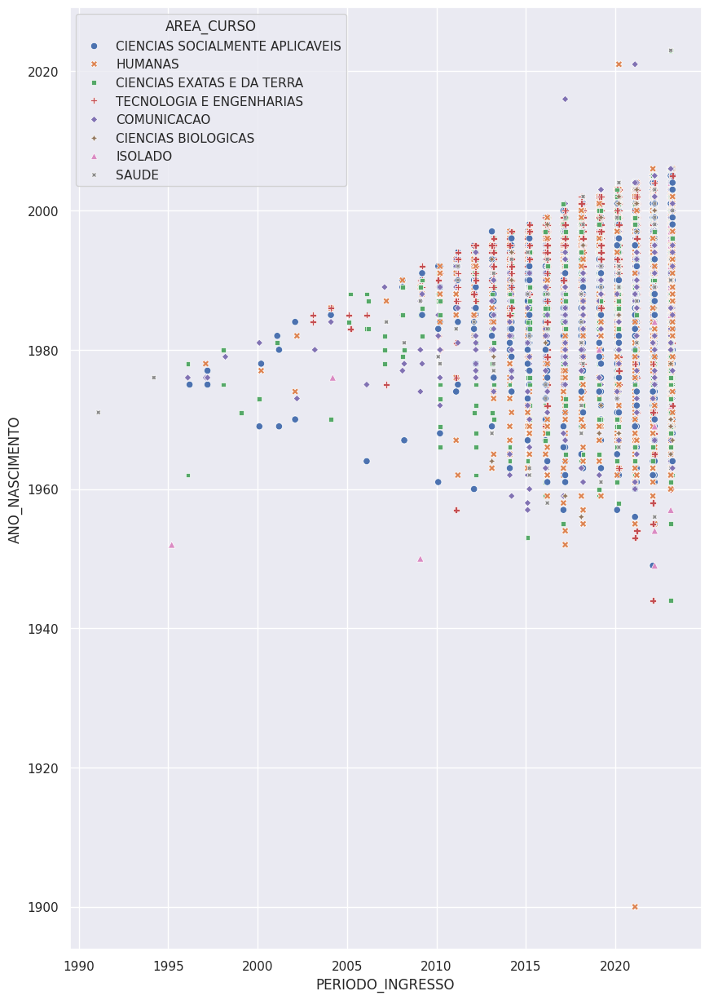

In [97]:
sns.set(rc = {'figure.figsize':(10, 15)})
sns.scatterplot(data=discentes, x="PERIODO_INGRESSO", y="ANO_NASCIMENTO", hue="AREA_CURSO", style="AREA_CURSO")

<Axes: xlabel='ANO_NASCIMENTO', ylabel='AREA_CURSO'>

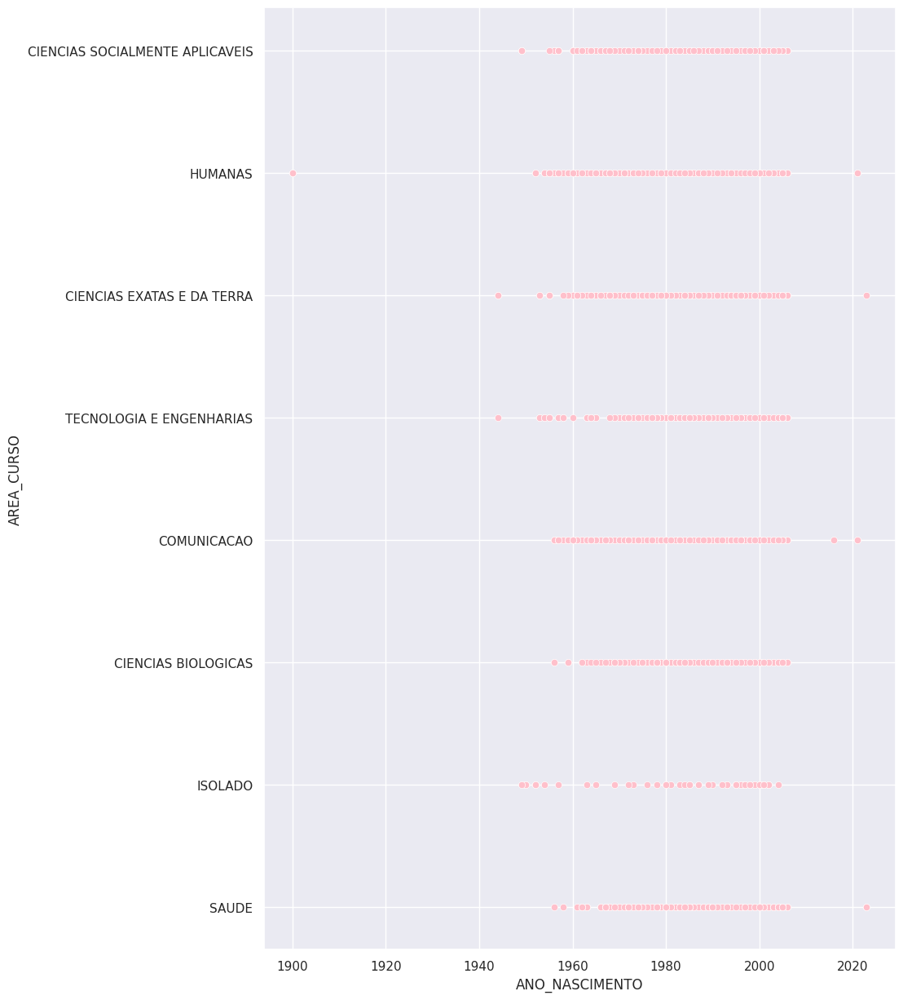

In [98]:
sns.scatterplot(data=discentes, x="ANO_NASCIMENTO", y="AREA_CURSO", color="pink")

<Axes: xlabel='ANO_NASCIMENTO', ylabel='NACIONALIDADE'>

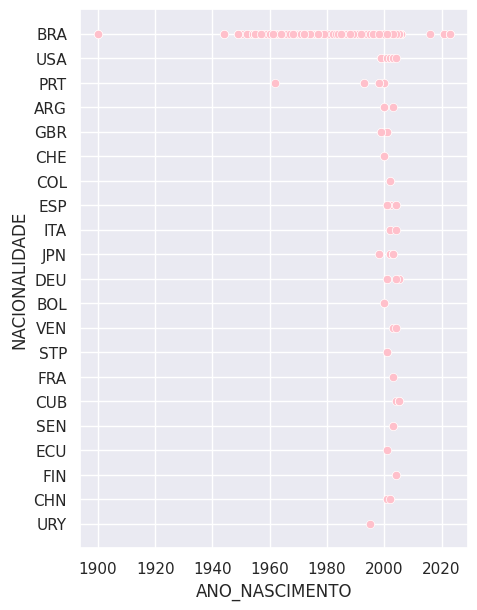

In [99]:
sns.set(rc = {'figure.figsize':(5, 7)})
sns.scatterplot(data=discentes, x="ANO_NASCIMENTO", y="NACIONALIDADE", color="pink")

### **Mapa de calor para correlação (heatmap)**

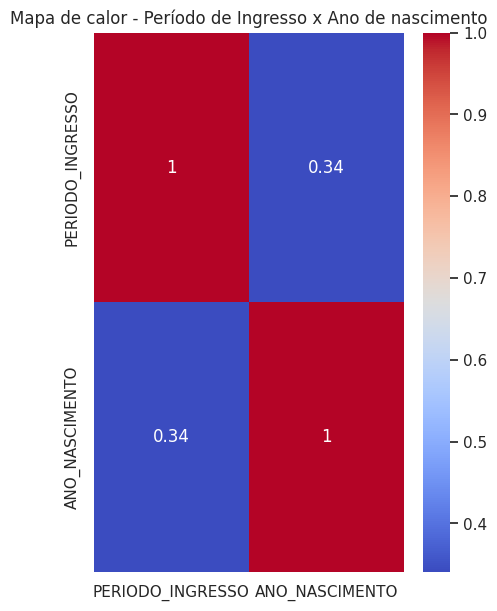

In [100]:
subset1 = discentes[['PERIODO_INGRESSO', 'ANO_NASCIMENTO']]
matriz_rel1 = subset1.corr()
sns.heatmap(matriz_rel1, annot = True, cmap = 'coolwarm')
plt.title('Mapa de calor - Período de Ingresso x Ano de nascimento')
plt.show()

In [101]:
from folium import plugins
from folium.plugins import HeatMap

df = pd.read_csv('/content/gdrive/My Drive/estatistica/municípios_pernambuco.csv')

In [102]:
baseMap = folium.Map(
    width = '100%',
    height = '100%',
    location=[-8.22144, -36.6395]
)

coord = df[['latitude', 'longitude', 'ocorrências']].values.tolist()

HeatMap(coord, radius = 20).add_to(baseMap)

baseMap

In [103]:
discentes['AREA_CURSO'], _ = pd.factorize(discentes['AREA_CURSO'])
discentes['AREA_CURSO']

0        0
1        0
2        1
3        1
4        2
        ..
67545    0
67546    2
67547    0
67548    4
67549    1
Name: AREA_CURSO, Length: 67550, dtype: int64

In [104]:
discentes['SEXO'], _ = pd.factorize(discentes['SEXO'])
discentes['SEXO']

0        0
1        0
2        1
3        1
4        0
        ..
67545    0
67546    1
67547    1
67548    0
67549    1
Name: SEXO, Length: 67550, dtype: int64

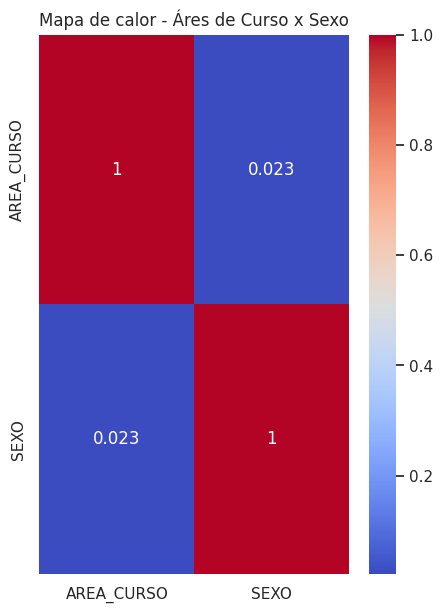

In [105]:
subset= discentes[['AREA_CURSO', 'SEXO']]

matriz_rel = subset.corr()
sns.heatmap(matriz_rel, annot = True, cmap = 'coolwarm')
plt.title('Mapa de calor - Áres de Curso x Sexo')
plt.show()

In [106]:
discentes['COTAS'], _ = pd.factorize(discentes['COTAS'])
discentes['COTAS']

0        0
1        0
2        0
3        0
4        0
        ..
67545    0
67546    0
67547    0
67548    0
67549    0
Name: COTAS, Length: 67550, dtype: int64

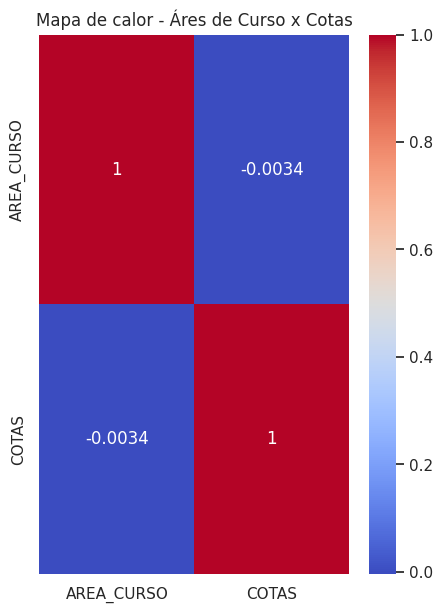

In [107]:
subset= discentes[['AREA_CURSO', 'COTAS']]

matriz_rel = subset.corr()
sns.heatmap(matriz_rel, annot = True, cmap = 'coolwarm')
plt.title('Mapa de calor - Áres de Curso x Cotas')
plt.show()

---

## **Normal padrão**

In [108]:
discentes['SEXO'], _ = pd.factorize(discentes['SEXO'])
discentes['SEXO']

0        0
1        0
2        1
3        1
4        0
        ..
67545    0
67546    1
67547    1
67548    0
67549    1
Name: SEXO, Length: 67550, dtype: int64

In [109]:
from sklearn.preprocessing import StandardScaler #sklearn.preprocessing fornece várias funções de utilidade comuns e classes de transformadores para alterar vetores de recursos brutos em uma representação mais adequada

subset4= discentes[['PERIODO_INGRESSO', 'PERIODO_LETIVO']]

scaler = StandardScaler() #o módulo standard.scaler padroniza os dados
ajuste = scaler.fit(subset4) #determina a média e o desvio padrão
normal = scaler.transform(subset4) #aplicar a normal padrão z=(valor - média)/desvio padrão

normalpadrao1 = pd.DataFrame(normal)
normalpadrao1.head(8)

,0,1
0,0.690545,-0.915038
1,0.690545,1.092850
2,-0.505370,-0.915038
3,-0.505370,1.092850
4,1.049319,-0.915038
5,0.650681,-0.915038
6,-5.727531,-0.915038
7,-5.727531,1.092850


In [110]:
subset5= discentes[['ANO_NASCIMENTO', 'SEXO']]

scaler = StandardScaler() #o módulo standard.scaler padroniza os dados
ajuste = scaler.fit(subset5) #determina a média e o desvio padrão
normal = scaler.transform(subset5) #aplicar a normal padrão z=(valor - média)/desvio padrão

normalpadrao = pd.DataFrame(normal)
normalpadrao.head(10)

,0,1
0,-2.731665,-1.033729
1,-2.731665,-1.033729
2,-3.300864,0.967371
3,-3.300864,0.967371
4,-2.873965,-1.033729
5,-2.731665,0.967371
6,-4.866163,-1.033729
7,-4.866163,-1.033729
8,-3.016265,0.967371
9,-3.016265,0.967371


Text(0, 0.5, 'Densidade de Probabilidade')

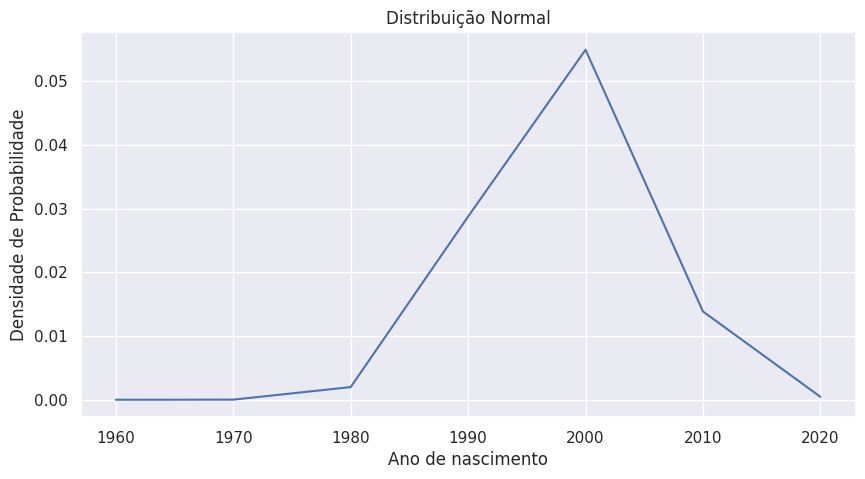

In [111]:
from scipy.stats import norm

data = discentes['ANO_NASCIMENTO'] #antes devem ser definidos quem é o df

media = data.mean()
desvio_padrao = data.std()
num = len(data)

x_valores = np.arange(1960, 2023, 10)
y_valores = norm.pdf(x_valores, media, desvio_padrao)

plt.figure(figsize=(10, 5))
plt.plot(x_valores, y_valores, label='Distribuição Normal')

plt.title('Distribuição Normal')
plt.xlabel('Ano de nascimento')
plt.ylabel('Densidade de Probabilidade')

Text(0, 0.5, 'Densidade de Probabilidade')

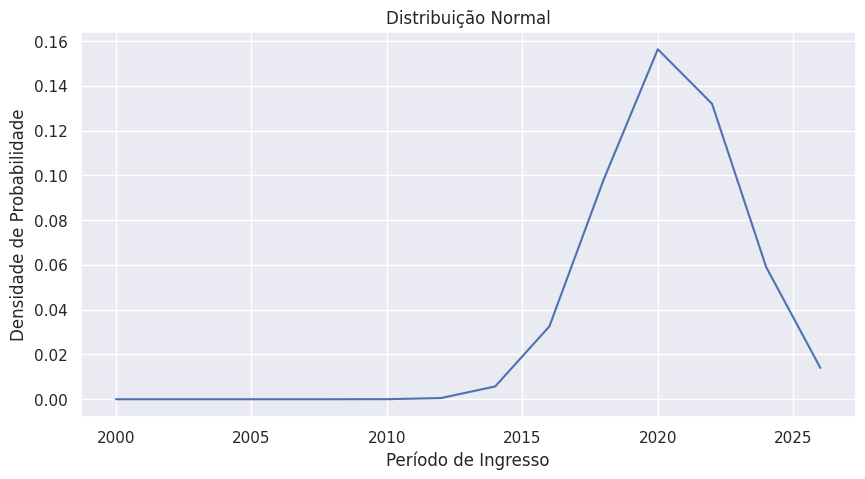

In [112]:
from scipy.stats import norm

data = discentes['PERIODO_INGRESSO'] #antes devem ser definidos quem é o df

media = data.mean()
desvio_padrao = data.std()
num = len(data)

x_valores = np.arange(2000, 2028, 2)
y_valores = norm.pdf(x_valores, media, desvio_padrao)

plt.figure(figsize=(10, 5))
plt.plot(x_valores, y_valores, label='Distribuição Normal')

plt.title('Distribuição Normal')
plt.xlabel('Período de Ingresso')
plt.ylabel('Densidade de Probabilidade')

Text(0, 0.5, 'Densidade de Probabilidade')

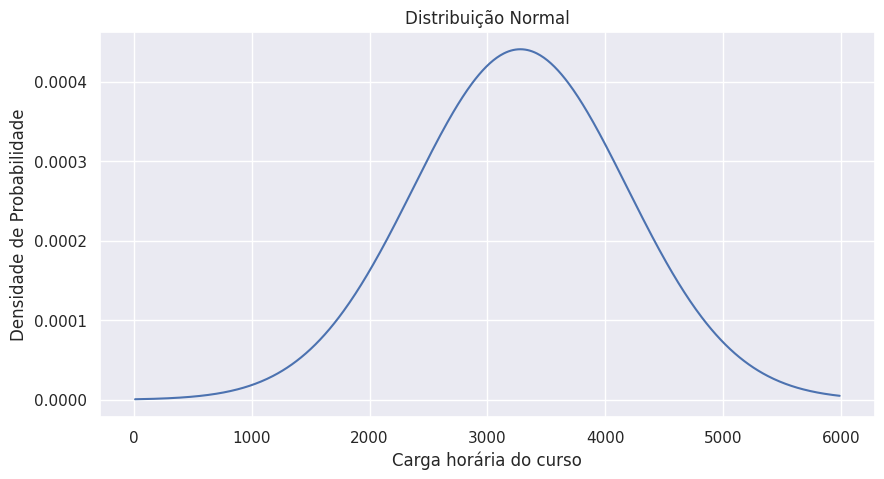

In [118]:
from scipy.stats import norm

data = discentes['CARGA_HORARIA_CURSO'] #antes devem ser definidos quem é o df

media = data.mean()
desvio_padrao = data.std()
num = len(data)

x_valores = np.arange(10, 6000, 10)
y_valores = norm.pdf(x_valores, media, desvio_padrao)

plt.figure(figsize=(10, 5))
plt.plot(x_valores, y_valores, label='Distribuição Normal')

plt.title('Distribuição Normal')
plt.xlabel('Carga horária do curso')
plt.ylabel('Densidade de Probabilidade')

---

## **Distribuições amostrais**

0        2022.2
1        2022.2
2        2019.2
3        2019.2
4        2023.1
          ...  
19995    2019.2
19996    2019.1
19997    2019.1
19998    2019.1
19999    2019.1
Name: PERIODO_INGRESSO, Length: 20000, dtype: float64
2018.015275
0        2022.2
1        2022.2
2        2019.2
3        2019.2
4        2023.1
          ...  
39995    2021.2
39996    2021.2
39997    2021.2
39998    2021.2
39999    2023.1
Name: PERIODO_INGRESSO, Length: 40000, dtype: float64
2019.147095
0        2022.2
1        2022.2
2        2019.2
3        2019.2
4        2023.1
          ...  
67544    2023.2
67545    2023.2
67546    2023.2
67547    2023.2
67548    2023.2
Name: PERIODO_INGRESSO, Length: 67549, dtype: float64
2020.4677004840928


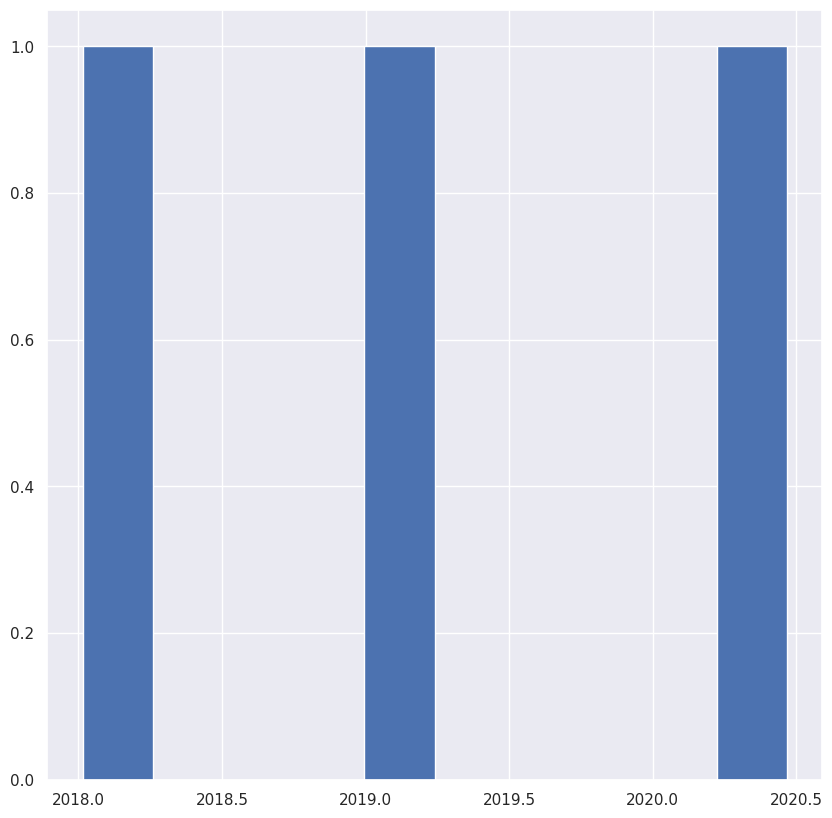

In [114]:
am = discentes['PERIODO_INGRESSO']

am1 = am[:20000]
print(am1)
media1= mean(am1)
print(media1)

am2 = am[:40000]
print(am2)
media2= mean(am2)
print(media2)

am3 = am[:67549]
print(am3)
media3= mean(am3)
print(media3)

medias = [media1, media2, media3]


plt.figure(figsize=(10, 10))
fig = px.histogram(discentes, x=medias)
fig.show()
plt.hist(medias)
plt.show()

0        1979
1        1979
2        1975
3        1975
4        1978
         ... 
19995    1998
19996    2001
19997    2001
19998    2001
19999    2001
Name: ANO_NASCIMENTO, Length: 20000, dtype: int64
1993.58995
0        1979
1        1979
2        1975
3        1975
4        1978
         ... 
39995    2003
39996    2003
39997    2003
39998    2003
39999    2003
Name: ANO_NASCIMENTO, Length: 40000, dtype: int64
1996.540825
0        1979
1        1979
2        1975
3        1975
4        1978
         ... 
67544    2004
67545    2003
67546    1996
67547    1998
67548    2001
Name: ANO_NASCIMENTO, Length: 67549, dtype: int64
1998.1966868495463


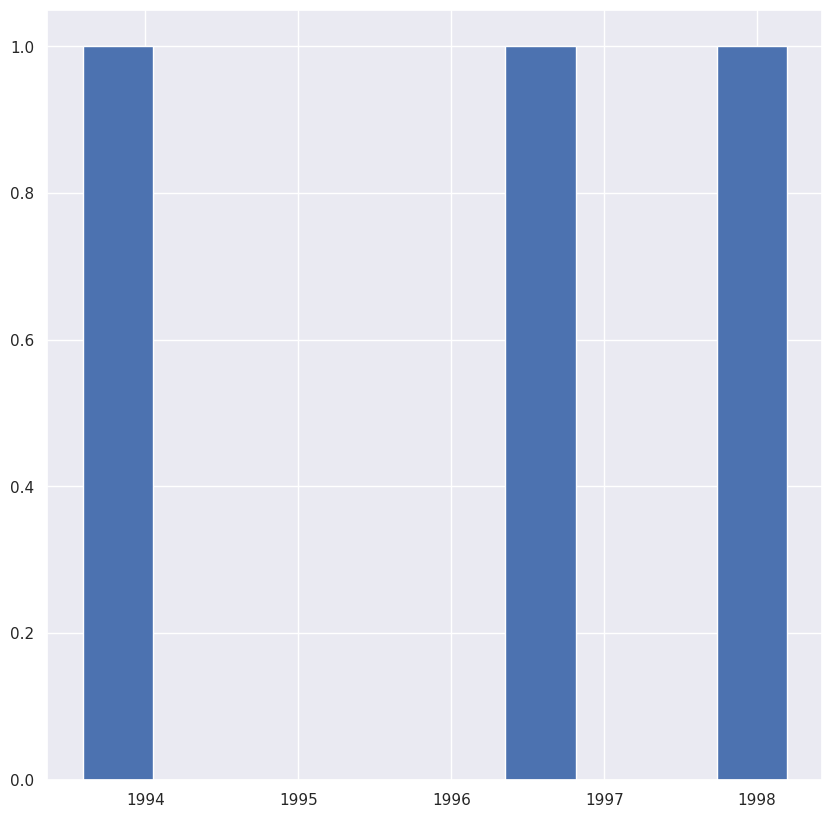

In [115]:
am = discentes['ANO_NASCIMENTO']

am1 = am[:20000]
print(am1)
media1= mean(am1)
print(media1)

am2 = am[:40000]
print(am2)
media2= mean(am2)
print(media2)

am3 = am[:67549]
print(am3)
media3= mean(am3)
print(media3)

medias = [media1, media2, media3]


plt.figure(figsize=(10, 10))
fig = px.histogram(discentes, x=medias)
fig.show()
plt.hist(medias)
plt.show()

0        2310
1        2310
2        3210
3        3210
4        3000
         ... 
19995    2820
19996    2910
19997    2910
19998    3210
19999    3210
Name: CARGA_HORARIA_CURSO, Length: 20000, dtype: int64
3304.98
0        2310
1        2310
2        3210
3        3210
4        3000
         ... 
39995    2760
39996    2760
39997    3255
39998    3255
39999     645
Name: CARGA_HORARIA_CURSO, Length: 40000, dtype: int64
3314.290325
0        2310
1        2310
2        3210
3        3210
4        3000
         ... 
67544    3915
67545    3000
67546    3000
67547    3300
67548    3150
Name: CARGA_HORARIA_CURSO, Length: 67549, dtype: int64
3279.737701520378


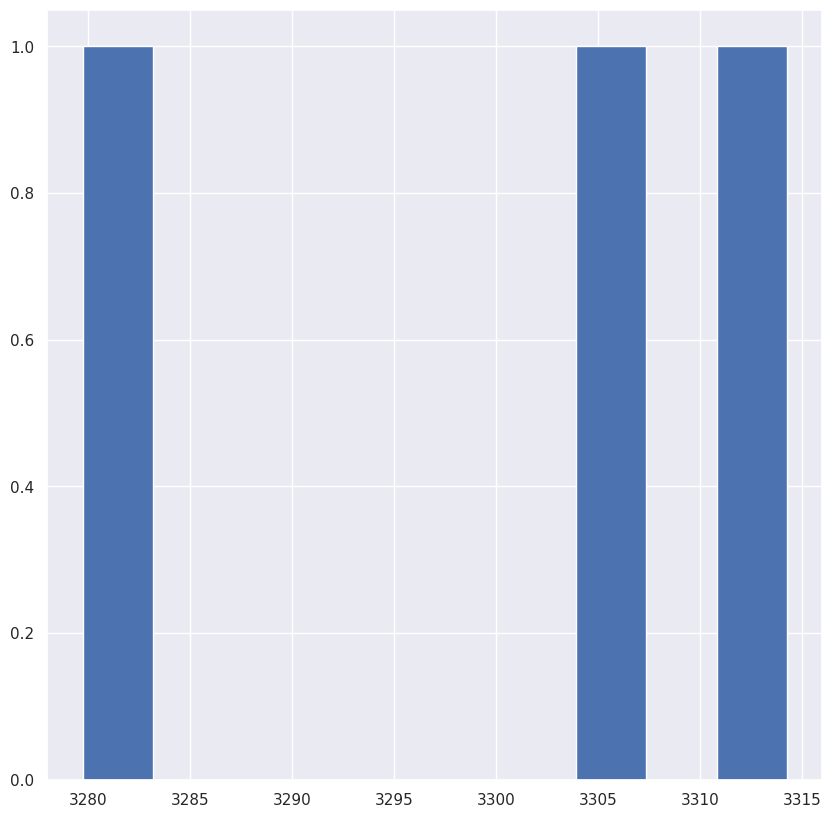

In [116]:
am = discentes['CARGA_HORARIA_CURSO']

am1 = am[:20000]
print(am1)
media1= mean(am1)
print(media1)

am2 = am[:40000]
print(am2)
media2= mean(am2)
print(media2)

am3 = am[:67549]
print(am3)
media3= mean(am3)
print(media3)

medias = [media1, media2, media3]


plt.figure(figsize=(10, 10))
plt.hist(medias)
plt.show()

---

## **Intervalo de confiança**

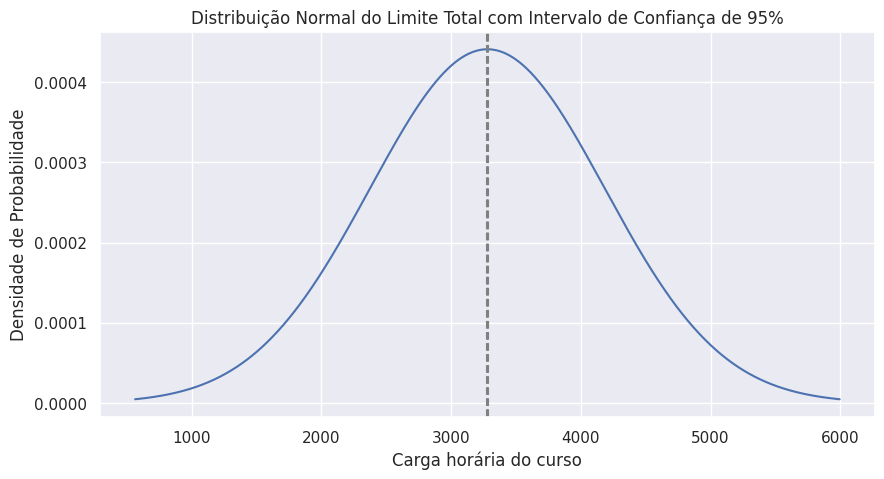

In [117]:
from scipy.stats import norm

data = discentes['CARGA_HORARIA_CURSO'] #antes devem ser definidos quem é o df

media = data.mean()
desvio_padrao = data.std()
num = len(data)

erro_padrao = desvio_padrao / np.sqrt(num)

z_valor = norm.ppf(0.95) #comando ppf encotra o valor solicitado
margem_erro = erro_padrao * z_valor

limite_inferior = media - margem_erro
limite_superior = media + margem_erro

x_valores = np.linspace(media - 3*desvio_padrao, media + 3*desvio_padrao, 1000)
y_valores = norm.pdf(x_valores, media, desvio_padrao)

plt.figure(figsize=(10, 5))
plt.plot(x_valores, y_valores, label='Distribuição Normal')


plt.axvline(x=limite_inferior, color='grey', linestyle='--', label=f'Limite Inferior = {limite_inferior:.2f}') #comando que adiciona linhas verticais: axvline
plt.axvline(x=limite_superior, color='grey', linestyle='--', label=f'Limite Superior = {limite_superior:.2f}')


plt.title('Distribuição Normal do Limite Total com Intervalo de Confiança de 95%')
plt.xlabel('Carga horária do curso')
plt.ylabel('Densidade de Probabilidade')

plt.show()